In [1]:
import pandas as pd
import numpy as np
df=pd.read_csv("C:\\Users\\biplo\\Desktop\Practicum 1\\Shooting.csv")
pd.set_option('display.max_rows', 100)
df.head(1000)

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1195,Lance Light,2016-01-02,shot,gun,54.0,M,W,Maryneal,TX,False,attack,Car,False,-100.450,32.235,True
996,1198,Lonnie Haskell Powers,2016-01-02,shot,gun,37.0,M,W,Sioux Falls,SD,False,attack,Not fleeing,False,-96.711,43.547,True
997,1138,Sean O'Brien,2016-01-02,shot and Tasered,knife,37.0,M,W,Livingston,MT,False,other,Not fleeing,False,-110.573,45.656,True
998,1140,Germonta Wallace,2016-01-03,shot,gun,30.0,M,B,Charlotte,NC,False,attack,Not fleeing,False,-80.885,35.218,True


In [2]:
#Fill NA for age with -1
df['age'].fillna(-1, inplace=True)
#define age group
conditions = [(df['age']>=0) & (df['age']<=9) ,
              (df['age']>=10) & (df['age']<=19) ,
              (df['age']>=20) & (df['age']<=29) ,
              (df['age']>=30) & (df['age']<=39) ,
              (df['age']>=40) & (df['age']<=49) ,
              (df['age']>=50) & (df['age']<=59) ,
              (df['age']>=60) & (df['age']<=69) ,
              (df['age']>=70) & (df['age']<=79) ,
              (df['age']>=80),
              (df['age']==-1)                         
             ]

values =['Under 10' ,
         '10 to 19' ,
         '20 to 29' ,
         '30 to 39' ,
         '40 to 49' ,
         '50 to 59' ,
         '60 to 69' ,
         '70 to 79' ,
         '80 +' ,
         'Unknown'         
]

df['AgeGroup']=np.select(conditions,values)

df.AgeGroup.unique()

array(['50 to 59', '40 to 49', '20 to 29', '30 to 39', '10 to 19',
       '70 to 79', '60 to 69', 'Unknown', '80 +', 'Under 10'],
      dtype=object)

In [3]:
#define year
df['Year']=pd.DatetimeIndex(df['date']).year
#define count column
df['RaceCount']=0
df.loc[df['race'].str.len()>0,'RaceCount'] = 1 
#define MonthYear from date
df['MonthYear'] = df['date'].to_numpy().astype('datetime64[M]')
df

,id,name,date,manner_of_death,armed,age,gender,race,city,state,...,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,AgeGroup,Year,RaceCount,MonthYear
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,...,attack,Not fleeing,False,-123.122,47.247,True,50 to 59,2015,1,2015-01-01
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,...,attack,Not fleeing,False,-122.892,45.487,True,40 to 49,2015,1,2015-01-01
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,...,other,Not fleeing,False,-97.281,37.695,True,20 to 29,2015,1,2015-01-01
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,...,attack,Not fleeing,False,-122.422,37.763,True,30 to 39,2015,1,2015-01-01
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,...,attack,Not fleeing,False,-104.692,40.384,True,30 to 39,2015,1,2015-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6545,7146,NaN,2021-08-30,shot,undetermined,-1.0,M,NaN,Normal,IL,...,undetermined,NaN,False,-88.983,40.542,True,Unknown,2021,0,2021-08-01
6546,7147,Etianna Planellas,2021-08-30,shot,toy weapon,48.0,F,NaN,Miami Shores,FL,...,other,Not fleeing,False,-80.195,25.862,True,40 to 49,2021,0,2021-08-01
6547,7143,Jeremy Michael Berg,2021-08-31,shot,knife,45.0,M,NaN,Martelle,IA,...,other,NaN,False,-91.346,41.999,True,40 to 49,2021,0,2021-08-01
6548,7145,George D. Watson,2021-08-31,shot,toy weapon,34.0,M,NaN,Washington,DC,...,attack,Not fleeing,True,-77.032,38.918,True,30 to 39,2021,0,2021-08-01


In [4]:
#see in how many ways a victim is armed
df.armed.unique()

array(['gun', 'unarmed', 'toy weapon', 'nail gun', 'knife', nan, 'shovel',
       'vehicle', 'hammer', 'hatchet', 'sword', 'machete', 'box cutter',
       'undetermined', 'metal object', 'screwdriver', 'lawn mower blade',
       'flagpole', 'guns and explosives', 'cordless drill', 'crossbow',
       'BB gun', 'metal pole', 'Taser', 'metal pipe', 'metal hand tool',
       'blunt object', 'metal stick', 'sharp object', 'meat cleaver',
       'carjack', 'chain', "contractor's level", 'railroad spikes',
       'stapler', 'beer bottle', 'unknown weapon', 'binoculars',
       'bean-bag gun', 'baseball bat and fireplace poker',
       'straight edge razor', 'gun and knife', 'ax', 'brick',
       'baseball bat', 'hand torch', 'chain saw', 'garden tool',
       'scissors', 'pole', 'pick-axe', 'flashlight', 'baton', 'spear',
       'chair', 'pitchfork', 'hatchet and gun', 'rock', 'piece of wood',
       'pipe', 'glass shard', 'motorcycle', 'pepper spray', 'metal rake',
       'crowbar', 'oar', '

In [56]:
#define Armed? colum to determine if armed
df['Armed?']='Yes'
df.loc[df['armed']=='unarmed','Armed?'] = 'No' 
df.loc[df['armed']=='undetermined','Armed?'] = 'No' 
df_armed=pd.pivot_table(df,index='Year',columns='Armed?',values='RaceCount', aggfunc='sum',fill_value=0,margins=True)
#armed %
df_armed['PercentArmed']=round(df_armed['Yes']/df_armed['All']*100)
df_armed


Armed?,No,Yes,All,PercentArmed
Year,,,,
2015,115,856,971,88.0
2016,95,810,905,90.0
2017,86,822,908,91.0
2018,64,839,903,93.0
2019,70,815,885,92.0
2020,69,832,901,92.0
2021,46,320,366,87.0
All,545,5294,5839,91.0


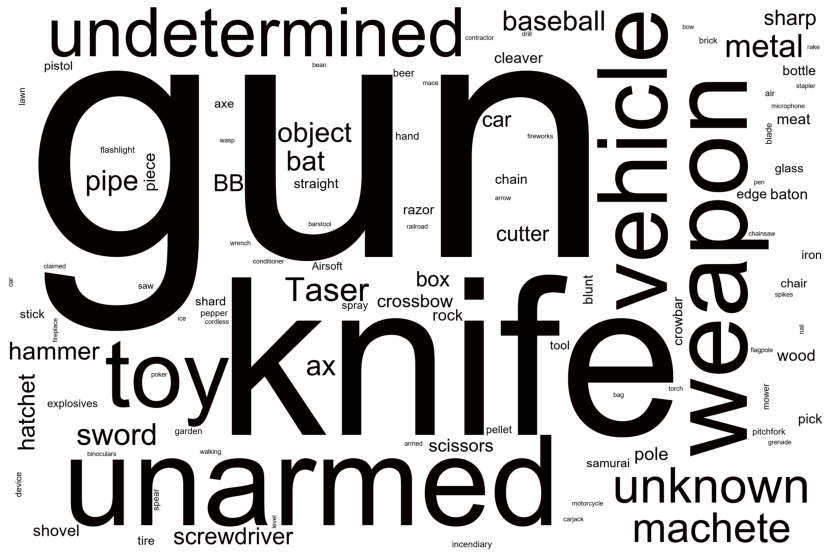

In [6]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

text = df[df['armed'].notnull()] 
text=df['armed'].str.cat(sep=' ')

wordcloud=WordCloud(font_path = 'arial',collocations=False,background_color="white", width=3000, height=2000, max_words=500).generate(str(text)) #generate the cloud


wordcloud.recolor(color_func = black_color_func)
plt.figure(figsize=[15,10])
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.imshow(wordcloud) #print

In [69]:
#signs of mental illness
df_illness=pd.pivot_table(df,index='Year',columns='signs_of_mental_illness',values='RaceCount', aggfunc='sum',fill_value=0,margins=True)
df_illness['Percet_ill']=round(df_illness.iloc[:,1]/df_illness['All']*100)
df_illness

signs_of_mental_illness,False,True,All,Percet_ill
Year,,,,
2015,720,251,971,26.0
2016,671,234,905,26.0
2017,681,227,908,25.0
2018,704,199,903,22.0
2019,692,193,885,22.0
2020,713,188,901,21.0
2021,304,62,366,17.0
All,4485,1354,5839,23.0


<AxesSubplot:>

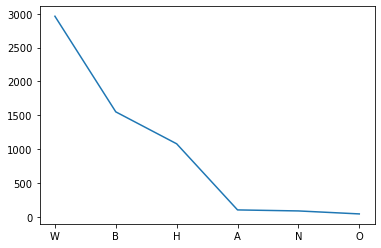

In [7]:
#basic plot count by race
df['race'].value_counts().plot()

In [8]:
#get details to accompany the chart for
df['Details']=df['manner_of_death'] +' in '+ df['city']+', ' + df['state']

#chart
import plotly.graph_objects as go
fig = go.Figure(data=go.Scattergeo(
        lon = df['longitude'],
        lat = df['latitude'],
        text = df['Details'],
        mode = 'markers',
        marker_color = df['id'],
        ))
fig.update_layout(title = 'Shooting in USA by Location ', title_x=0.5,geo_scope='usa')
fig.show()

In [70]:
#create a new df that has the count of shootings by state
df_state_count=df.groupby("state")["id"].count()
df_state_count=df_state_count.to_frame()
df_state_count.rename(columns = {'id':'Count'}, inplace = True) #rename column
States =df_state_count.index
df_state_count.insert(0, 'State', States)
df_state_count.reset_index(drop=True, inplace=True)
df_state_count.head(10)

,State,Count
0,AK,47
1,AL,124
2,AR,95
3,AZ,301
4,CA,966
5,CO,234
6,CT,23
7,DC,20
8,DE,16
9,FL,428


In [10]:
import plotly.express as px
fig = px.choropleth(df_state_count, locations="State",
                    locationmode="USA-states",
                    scope="usa",
                    color_continuous_scale="magma",
                    range_color=(0, 500),
                    color="Count")

fig.update_layout(title = 'Shooting in USA by States ', title_x=0.5,geo_scope='usa')
fig.show()


In [71]:
# we can see some races as NaN where data is not available. Let's replace them with 0
pvt_fill=pd.pivot_table(df,index='Year',columns='race',values='RaceCount', aggfunc='sum',fill_value=0)
pvt_fill


race,A,B,H,N,O,W
Year,,,,,,
2015,15,258,173,9,14,502
2016,15,236,161,17,11,465
2017,16,223,181,22,6,460
2018,22,232,168,16,4,461
2019,20,251,168,13,9,424
2020,15,244,171,9,3,459
2021,3,108,59,5,0,191


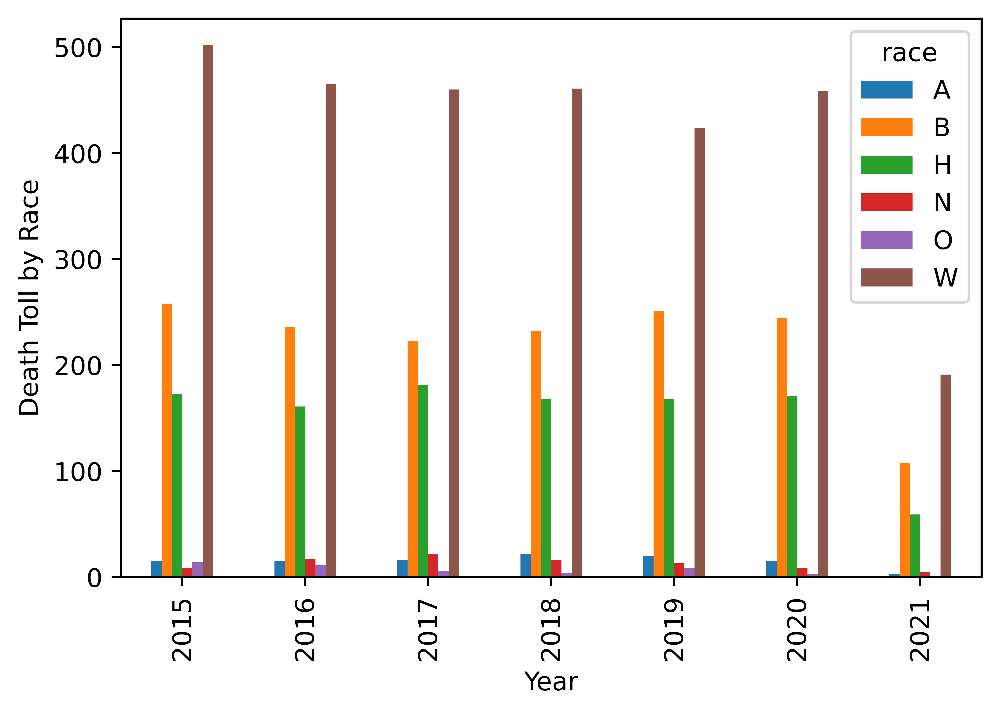

In [78]:
#a different view with stacked bars that provide a clearer view of what race is being impacted the most
ax2=pvt_fill.plot(kind='bar')
ylab2=ax2.set_ylabel('Death Toll by Race')

In [72]:
# let's also add a total column
pvt_total=pd.pivot_table(df,index='Year',columns='race',values='RaceCount', aggfunc='sum',fill_value=0,margins=True)
pvt_total


race,A,B,H,N,O,W,All
Year,,,,,,,
2015,15,258,173,9,14,502,971
2016,15,236,161,17,11,465,905
2017,16,223,181,22,6,460,908
2018,22,232,168,16,4,461,903
2019,20,251,168,13,9,424,885
2020,15,244,171,9,3,459,901
2021,3,108,59,5,0,191,366
All,106,1552,1081,91,47,2962,5839


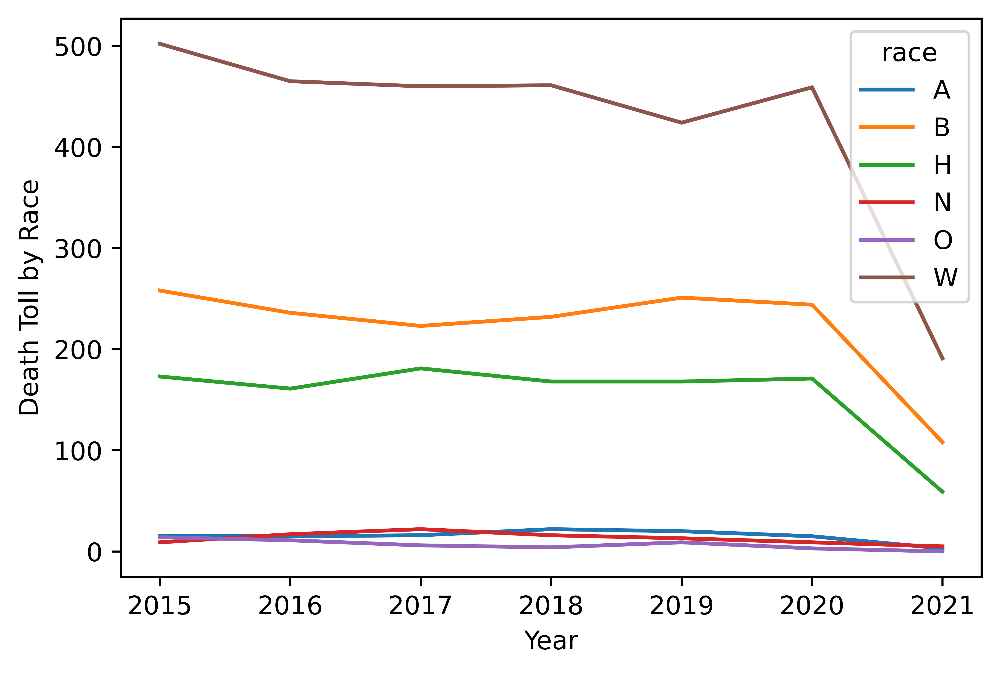

In [73]:
#chart by race by year
ax=pvt_fill.plot(xticks=pvt_fill.index)
ylab=ax.set_ylabel('Death Toll by Race')

In [75]:
#pivot by race and year
pvt2=pd.pivot_table(df,index='race',columns='Year',values='RaceCount', aggfunc='sum',fill_value=0)
pvt2


Year,2015,2016,2017,2018,2019,2020,2021
race,,,,,,,
A,15,15,16,22,20,15,3
B,258,236,223,232,251,244,108
H,173,161,181,168,168,171,59
N,9,17,22,16,13,9,5
O,14,11,6,4,9,3,0
W,502,465,460,461,424,459,191


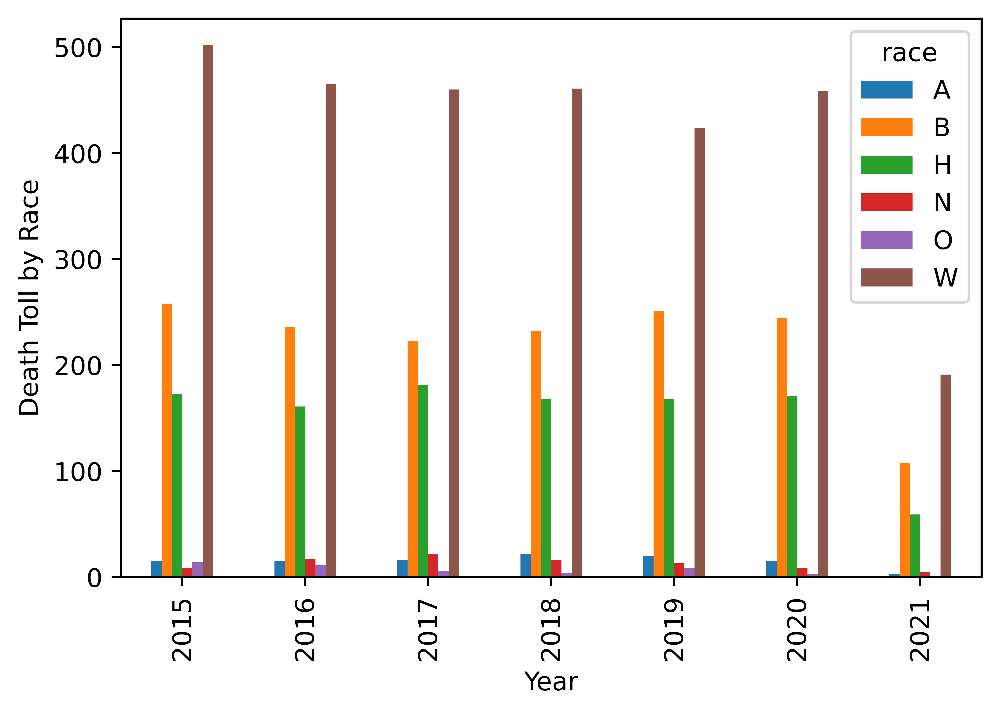

In [76]:
#a different view with stacked bars that provide a clearer view of what race is being impacted the most
ax2=pvt_fill.plot(kind='bar')
ylab2=ax2.set_ylabel('Death Toll by Race')

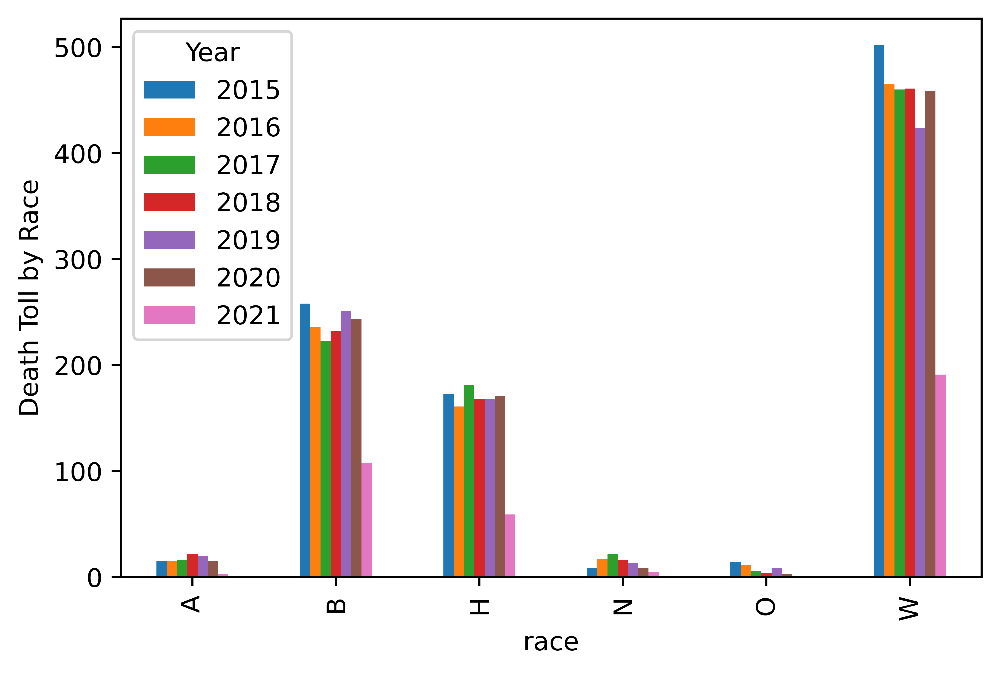

In [77]:
# stacked bar chart plot by year and race with race as x-axis
ax2=pvt2.plot(kind='bar')
ylab2=ax2.set_ylabel('Death Toll by Race')

In [79]:
#pivot table by age group
pvt_age=pd.pivot_table(df,index='AgeGroup',columns='Year',values='RaceCount', aggfunc='sum',fill_value=0,margins=False)
pvt_age_total=pd.pivot_table(df,index='AgeGroup',columns='Year',values='RaceCount', aggfunc='sum',fill_value=0,margins=True)
pvt_age_total

Year,2015,2016,2017,2018,2019,2020,2021,All
AgeGroup,,,,,,,,
10 to 19,53,53,54,49,41,44,18,312
20 to 29,294,251,261,247,230,221,103,1607
30 to 39,273,290,268,261,263,301,128,1784
40 to 49,182,142,160,181,161,171,58,1055
50 to 59,114,114,109,87,106,84,32,646
60 to 69,40,33,34,44,43,47,12,253
70 to 79,8,8,11,12,9,5,4,57
80 +,1,3,2,4,1,3,1,15
Under 10,1,0,1,0,0,0,0,2


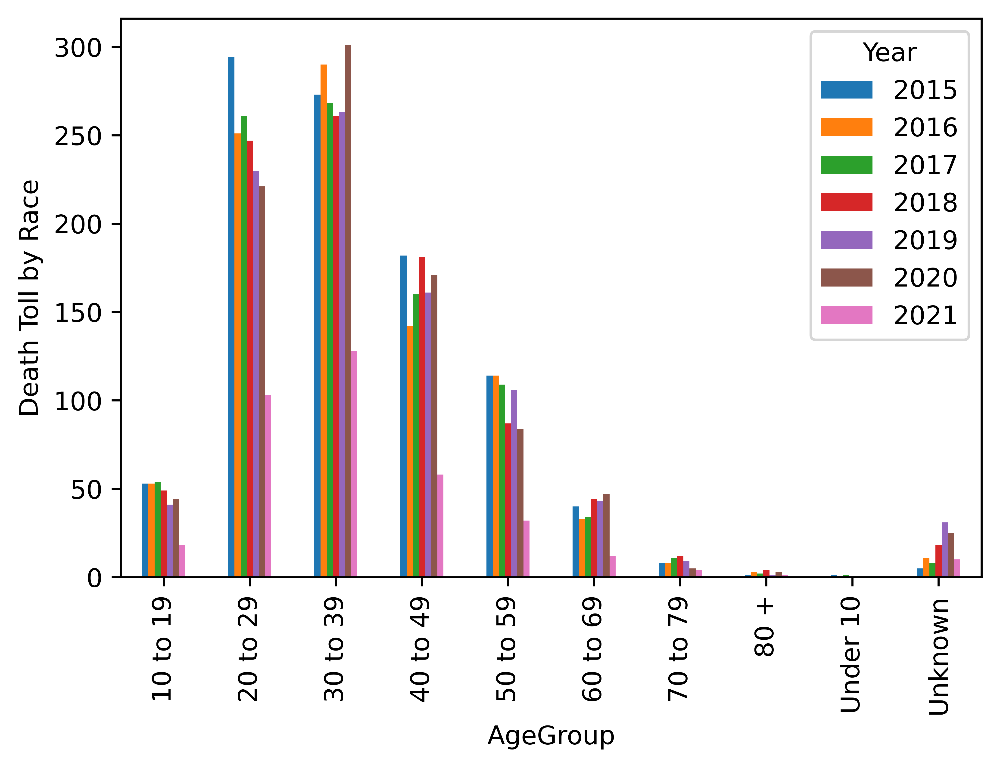

In [80]:
# stacked bar chart by Age Group
ax2=pvt_age.plot(kind='bar')
ylab2=ax2.set_ylabel('Death Toll by Race')

In [81]:
#pivot with count by race and state
pvt_state=pd.pivot_table(df,index='race',columns='state',values='RaceCount', aggfunc='sum', fill_value=0)
#the columns are not being displayed for all states to expanding the view to include all
pd.set_option('display.max_columns', 55)
pvt_state


state,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,GA,HI,IA,ID,IL,IN,KS,KY,LA,MA,MD,ME,MI,MN,MO,MS,MT,NC,ND,NE,NH,NJ,NM,NV,NY,OH,OK,OR,PA,RI,SC,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
race,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A,2,0,2,0,35,5,0,0,0,1,3,12,0,1,0,0,0,1,2,0,1,0,1,3,1,1,0,1,0,0,0,1,0,3,1,2,3,0,1,0,1,1,1,6,1,1,0,9,2,1,0
B,3,37,26,22,158,20,5,16,6,135,95,2,8,1,69,33,8,16,69,8,58,1,31,14,55,28,0,56,0,6,0,33,2,17,52,71,36,8,47,2,29,0,38,120,7,47,0,25,24,8,0
H,0,2,0,99,377,59,7,0,1,60,14,1,0,6,17,5,10,3,2,8,4,1,2,3,3,1,0,8,0,3,0,8,77,31,11,2,11,8,9,1,2,0,4,170,13,5,0,24,7,0,2
N,10,0,0,13,4,5,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,5,0,0,5,1,7,1,0,0,2,1,0,0,11,0,0,0,0,5,0,1,2,1,1,7,4,0,2
O,0,0,0,0,8,2,0,0,0,5,0,15,0,0,0,0,0,0,0,1,0,1,1,3,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,1,3,1,1,0,2,0,0,0
W,28,72,57,120,257,113,10,2,6,188,95,3,29,38,36,75,39,83,47,22,31,20,57,46,82,44,32,107,6,22,16,22,28,47,43,96,116,77,60,1,61,11,110,204,48,52,8,80,64,41,10


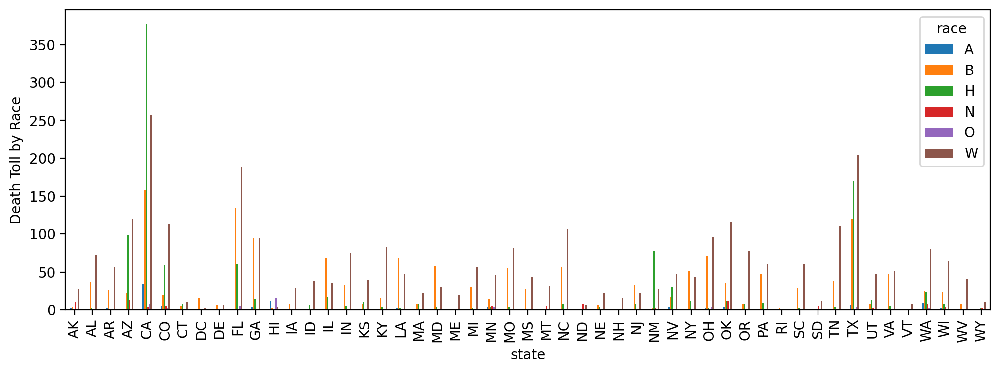

In [22]:
#Plot the chart with state level detail
import matplotlib.pyplot as plt
# updating the chart to have a better view
plt.rcParams["figure.figsize"] = (12,4)
plt.rcParams["figure.dpi"] = (200)
pvt_state_nototal=pd.pivot_table(df,index='race',columns='state',values='RaceCount', aggfunc='sum', fill_value=0)

ax3=pvt_state_nototal.T.plot(kind='bar')
ylab3=ax3.set_ylabel('Death Toll by Race')

In [83]:
#getting top 10 states based on counts 

pvt_rev=pd.pivot_table(df,index='state',columns='race',values='RaceCount', aggfunc='sum', fill_value=0, margins='True')
pvt_rev

pvt_rev_top10=pvt_rev.nlargest(10,'All')
pvt_rev_top10


race,A,B,H,N,O,W,All
state,,,,,,,
All,106,1552,1081,91,47,2962,5839
CA,35,158,377,4,8,257,839
TX,6,120,170,1,3,204,504
FL,1,135,60,0,5,188,389
AZ,0,22,99,13,0,120,254
GA,3,95,14,0,0,95,207
CO,5,20,59,5,2,113,204
OK,3,36,11,11,0,116,177
OH,2,71,2,0,3,96,174


In [84]:
#getting a dataset that has state names and state Codes
df_state=pd.read_csv("C:\\Users\\biplo\\Desktop\Practicum 1\\State_Info.csv")
df_state.head()

,State,Abbrev,Code
0,Alabama,Ala.,AL
1,Alaska,Alaska,AK
2,Arizona,Ariz.,AZ
3,Arkansas,Ark.,AR
4,California,Calif.,CA


In [85]:
#joining state and police dataset
df= pd.merge(df, df_state,left_on='state', right_on='Code', how="left")
df.head()


,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,AgeGroup,Year,RaceCount,MonthYear,Armed?,Details,State_x,Abbrev_x,Code_x,State_y,Abbrev_y,Code_y
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True,50 to 59,2015,1,2015-01-01,Yes,"shot in Shelton, WA",Washington,Wash.,WA,Washington,Wash.,WA
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True,40 to 49,2015,1,2015-01-01,Yes,"shot in Aloha, OR",Oregon,Ore.,OR,Oregon,Ore.,OR
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True,20 to 29,2015,1,2015-01-01,No,"shot and Tasered in Wichita, KS",Kansas,Kans.,KS,Kansas,Kans.,KS
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True,30 to 39,2015,1,2015-01-01,Yes,"shot in San Francisco, CA",California,Calif.,CA,California,Calif.,CA
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True,30 to 39,2015,1,2015-01-01,Yes,"shot in Evans, CO",Colorado,Colo.,CO,Colorado,Colo.,CO


In [86]:
#import MedianEarning
df_income=pd.read_csv("C:\\Users\\biplo\\Desktop\Practicum 1\\MedianEarning.csv")
df_income=df_income.T
#rename columns based on the first row and exclude first row
df_income=df_income.rename(columns=df_income.iloc[0])
df_income= df_income.iloc[1: , :] #to remove the first line
df_income.index.name = 'State'
df_income = pd.merge(df_income,df_state[['State','Code']],on='State', how='left') # jon to get state abbv
df_income=df_income.iloc[: ,1:3]# remove the state column
df_income.rename(columns = {'Code':'State'}, inplace = True) #rename Code to State 
first_column_income =df_income.pop('State') #shift State column to first position
df_income.insert(0, 'State', first_column_income)
df_income['MedianEarning'] = df_income['MedianEarning'].astype(int)
df_income


,State,MedianEarning
0,AL,37217
1,AK,47809
2,AZ,39956
3,AR,35215
4,CA,45095
5,CO,46887
6,CT,50788
7,DE,43164
8,DC,71361
9,FL,36021


In [87]:
#import poverty level
df_poverty=pd.read_csv("C:\\Users\\biplo\\Desktop\Practicum 1\\Poverty.csv")
df_poverty=df_poverty.T
#rename columns based on the first row and exclude first row
df_poverty=df_poverty.rename(columns=df_poverty.iloc[0])
df_poverty= df_poverty.iloc[1: , :] #to remove the first line
df_poverty.index.name = 'State'
df_poverty = pd.merge(df_poverty,df_state[['State','Code']],on='State', how='left') # jon to get state abbv
df_poverty=df_poverty.iloc[: ,1:3]# remove the state column
df_poverty.rename(columns = {'Code':'State'}, inplace = True) #rename Code to State 
first_column_poverty =df_poverty.pop('State') #shift State column to first position
df_poverty.insert(0, 'State', first_column_poverty)
df_poverty['Poverty Below HS Rate'] = df_poverty['Poverty Below HS Rate'].astype(int)
df_poverty

,State,Poverty Below HS Rate
0,AL,29
1,AK,20
2,AZ,24
3,AR,26
4,CA,19
5,CO,18
6,CT,25
7,DE,24
8,DC,32
9,FL,23


In [88]:
#import no vehicle rate
df_vehicle=pd.read_csv("C:\\Users\\biplo\\Desktop\Practicum 1\\Vehicle.csv")
df_vehicle = pd.merge(df_vehicle,df_state[['State','Code']],on='State', how='left') # jon to get state abbv
df_vehicle=df_vehicle.iloc[: ,1:3]# remove the state column
df_vehicle.rename(columns = {'Code':'State'}, inplace = True) #rename Code to State 
first_column_vehicle =df_vehicle.pop('State') #shift State column to first position
df_vehicle.insert(0, 'State', first_column_vehicle)
df_vehicle


,State,NoVehiclesRate
0,AL,6
1,AK,10
2,AZ,6
3,AR,6
4,CA,7
5,CO,5
6,CT,9
7,DE,6
8,DC,35
9,FL,6


In [89]:
#import bachelors degree  rate
df_degree=pd.read_csv("C:\\Users\\biplo\\Desktop\Practicum 1\\BS Degree.csv")
df_degree = pd.merge(df_degree,df_state[['State','Code']],on='State', how='left') # jon to get state abbv
df_degree=df_degree.iloc[: ,1:3]# remove the state column
df_degree.rename(columns = {'Code':'State'}, inplace = True) #rename Code to State 
first_column_df_degree =df_degree.pop('State') #shift State column to first position
df_degree.insert(0, 'State', first_column_df_degree)
df_degree

,State,Bachelors Degree Rate
0,AL,26
1,AK,30
2,AZ,30
3,AR,23
4,CA,35
5,CO,43
6,CT,40
7,DE,33
8,DC,60
9,FL,31


In [90]:
#import mobile home rate
df_home=pd.read_csv("C:\\Users\\biplo\\Desktop\Practicum 1\\MobileHome.csv")
df_home = pd.merge(df_home,df_state[['State','Code']],on='State', how='left') # jon to get state abbv
df_home=df_home.iloc[: ,1:3]# remove the state column
df_home.rename(columns = {'Code':'State'}, inplace = True) #rename Code to State 
first_column_home =df_home.pop('State') #shift State column to first position
df_home.insert(0, 'State', first_column_home)
df_home

,State,MobileHomeRate
0,AL,13
1,AK,4
2,AZ,10
3,AR,12
4,CA,4
5,CO,4
6,CT,1
7,DE,8
8,DC,0
9,FL,9


In [91]:
#import population
df_pop=pd.read_csv("C:\\Users\\biplo\\Desktop\Practicum 1\\Population.csv")
df_pop = pd.merge(df_pop,df_state[['State','Code']],on='State', how='left') # jon to get state abbv
df_pop=df_pop.iloc[: ,1:3]# remove the state column
df_pop.rename(columns = {'Code':'State'}, inplace = True) #rename Code to State 
first_column_pop =df_pop.pop('State') #shift State column to first position
df_pop.insert(0, 'State', first_column_pop)
df_pop

,State,Population
0,AL,4903185
1,AK,731545
2,AZ,7278717
3,AR,3017804
4,CA,39512223
5,CO,5758736
6,CT,3565287
7,DE,973764
8,DC,705749
9,FL,21477737


In [92]:
#chart for no vehicle
fig_vehicle = px.choropleth(df_vehicle, locations="State",
                    locationmode="USA-states",
                    scope="usa",
                    color_continuous_scale="tealrose",
                    range_color=(0, 20),
                    color="NoVehiclesRate")
fig_vehicle.update_layout(title = 'No Vehicle Rate in USA by States ', title_x=0.5,geo_scope='usa')
fig_vehicle.show()

#chart for mobile home rate
fig_home = px.choropleth(df_home, locations="State",
                    locationmode="USA-states",
                    scope="usa",
                    color_continuous_scale="tealrose",
                    range_color=(0, 20),
                    color="MobileHomeRate")

fig_home.update_layout(title = 'Mobile Home Rate in USA by States ', title_x=0.5,geo_scope='usa')
fig_home.show()

#chart for degree
fig_degree = px.choropleth(df_degree, locations="State",
                    locationmode="USA-states",
                    scope="usa",
                    color_continuous_scale="tealrose",
                    range_color=(20, 50),
                    color="Bachelors Degree Rate")

fig_degree.update_layout(title = 'Degree Rate in USA by States ', title_x=0.5,geo_scope='usa')
fig_degree.show()


#chart for poverty
fig_poverty = px.choropleth(df_poverty, locations="State",
                    locationmode="USA-states",
                    scope="usa",
                    color_continuous_scale="tealrose",
                    range_color=(10, 30),
                    color="Poverty Below HS Rate")

fig_poverty.update_layout(title = 'Poverty Below HS Rate in USA by States ', title_x=0.5,geo_scope='usa')
fig_poverty.show()


#chart for earning
fig_earn = px.choropleth(df_income, locations="State",
                    locationmode="USA-states",
                    scope="usa",
                    color_continuous_scale="tealrose",
                    range_color=(30000, 50000),
                    color="MedianEarning")

fig_earn.update_layout(title = 'Median Earning in USA by States ', title_x=0.5,geo_scope='usa')
fig_earn.show()


#chart for earning
fig_pop = px.choropleth(df_pop, locations="State",
                    locationmode="USA-states",
                    scope="usa",
                    color_continuous_scale="tealrose",
                    range_color=(300000, 10000000),
                    color="Population")

fig_pop.update_layout(title = 'Population in USA by States ', title_x=0.5,geo_scope='usa')
fig_pop.show()


In [93]:
#count by state
pvt_count=pd.pivot_table(df,index='state',values='RaceCount', aggfunc='sum',fill_value=0)
pvt_count.rename(columns = {'RaceCount':'ShootingCount'}, inplace = True) #rename column
pvt_count.index.name = 'State'
pvt_count

,ShootingCount
State,
AK,43
AL,111
AR,85
AZ,254
CA,839
CO,204
CT,22
DC,18
DE,13


In [94]:
#set index for all supplemental data
df_vehicle_j=df_vehicle.set_index('State')
df_home_j=df_home.set_index('State')
df_income_j=df_income.set_index('State')
df_poverty_j=df_poverty.set_index('State')
df_degree_j=df_degree.set_index('State')
df_pop_j=df_pop.set_index('State')

In [95]:
#df with all state level data merged
df_all=pvt_count.merge(df_vehicle_j,on='State').merge(df_home_j,on='State').merge(df_income_j,on='State').merge(df_poverty_j,on='State').merge(df_degree_j,on='State')
df_all

,ShootingCount,NoVehiclesRate,MobileHomeRate,MedianEarning,Poverty Below HS Rate,Bachelors Degree Rate
State,,,,,,
AK,43,10,4,47809,20,30
AL,111,6,13,37217,29,26
AR,85,6,12,35215,26,23
AZ,254,6,10,39956,24,30
CA,839,7,4,45095,19,35
CO,204,5,4,46887,18,43
CT,22,9,1,50788,25,40
DC,18,35,0,71361,32,60
DE,13,6,8,43164,24,33


In [96]:
#convert all columns to int
df_all=df_all.astype(float)
#calculate the corelation
df_all.corr(method ='pearson')

,ShootingCount,NoVehiclesRate,MobileHomeRate,MedianEarning,Poverty Below HS Rate,Bachelors Degree Rate
ShootingCount,1.000000,-0.109455,0.049770,-0.109044,-0.073475,-0.069962
NoVehiclesRate,-0.109455,1.000000,-0.392953,0.682215,0.273284,0.570797
MobileHomeRate,0.049770,-0.392953,1.000000,-0.722570,0.511283,-0.664005
MedianEarning,-0.109044,0.682215,-0.722570,1.000000,-0.207508,0.897136
Poverty Below HS Rate,-0.073475,0.273284,0.511283,-0.207508,1.000000,-0.212367
Bachelors Degree Rate,-0.069962,0.570797,-0.664005,0.897136,-0.212367,1.000000


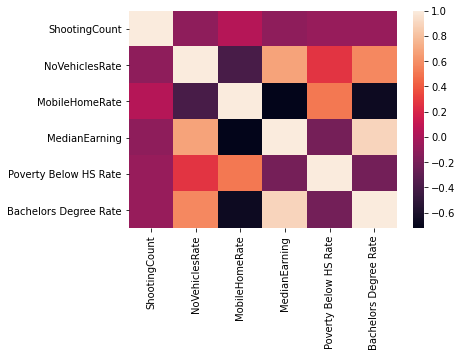

In [37]:
#corelation plot
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
corr=df_all.corr(method ='pearson')
sns.heatmap(corr)
plt.show()

In [38]:
#df for all rates to use as bar chart
df_all_Stacked=df_all[['NoVehiclesRate','MobileHomeRate','Poverty Below HS Rate','Bachelors Degree Rate']]
df_all_Stacked


,NoVehiclesRate,MobileHomeRate,Poverty Below HS Rate,Bachelors Degree Rate
State,,,,
AK,10.0,4.0,20.0,30.0
AL,6.0,13.0,29.0,26.0
AR,6.0,12.0,26.0,23.0
AZ,6.0,10.0,24.0,30.0
CA,7.0,4.0,19.0,35.0
CO,5.0,4.0,18.0,43.0
CT,9.0,1.0,25.0,40.0
DC,35.0,0.0,32.0,60.0
DE,6.0,8.0,24.0,33.0


In [39]:
#convert shooting to fit the chart
df_all_Shoot=round(df_all[['ShootingCount']]/10)
df_all_Shoot


,ShootingCount
State,
AK,4.0
AL,11.0
AR,8.0
AZ,25.0
CA,84.0
CO,20.0
CT,2.0
DC,2.0
DE,1.0


In [40]:
#convert earnings to fit the chart
df_MedianEarning=round(df_all[['MedianEarning']]/1000)
df_MedianEarning


,MedianEarning
State,
AK,48.0
AL,37.0
AR,35.0
AZ,40.0
CA,45.0
CO,47.0
CT,51.0
DC,71.0
DE,43.0


Text(0.5, 1.0, 'Shooting in the US and other Socio Economic Factors')

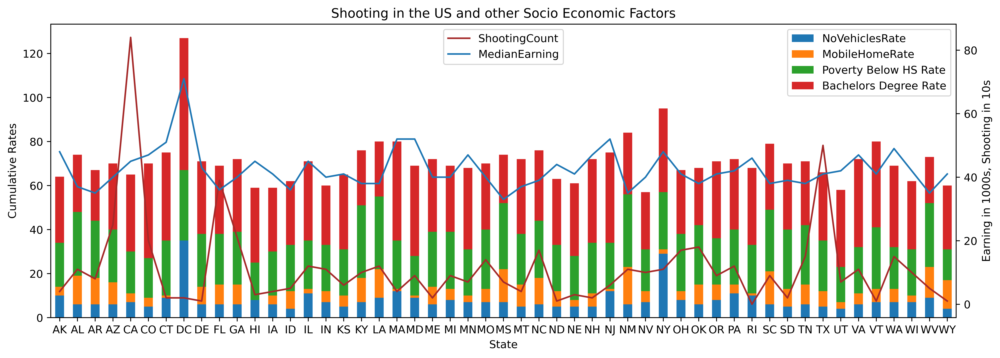

In [97]:
#final chart

from matplotlib import pyplot as plt
f1=df_all_Stacked.plot(kind='bar', stacked=True, figsize=(15, 5))
f2=df_all_Shoot['ShootingCount'].plot(secondary_y=True, color ='brown')
f3=df_MedianEarning['MedianEarning'].plot(secondary_y=True)

f1.set_ylabel('Cumulative Rates')
f2.set_ylabel('Earning in 1000s, Shooting in 10s')
f2.legend(loc='upper center')
plt.rcParams["figure.dpi"] = (800)
plt.title('Shooting in the US and other Socio Economic Factors')


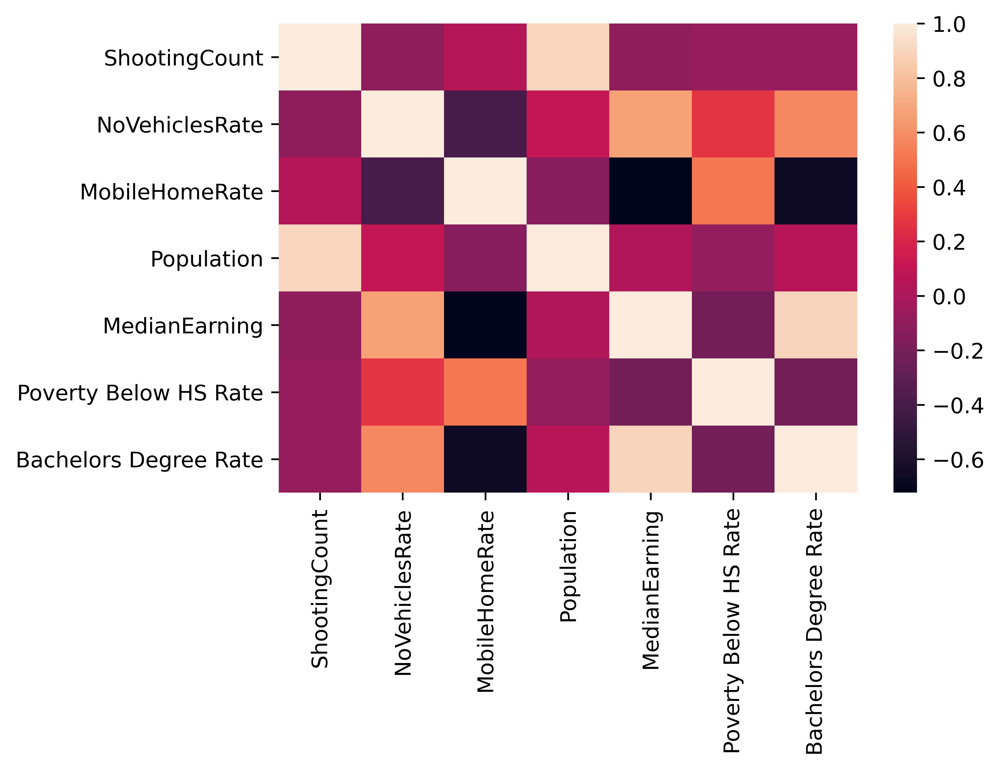

In [98]:
#now adding population data for new corealation
df_all_withpop=pvt_count.merge(df_vehicle_j,on='State').merge(df_home_j,on='State').merge(df_pop_j,on='State').merge(df_income_j,on='State').merge(df_poverty_j,on='State').merge(df_degree_j,on='State')
#convert all columns to int
df_all_withpop=df_all_withpop.astype(float)
#calculate the corelation
df_all_withpop.corr(method ='pearson')
corr_withpop=df_all_withpop.corr(method ='pearson')
sns.heatmap(corr_withpop)
plt.show()

Text(0.5, 1.0, 'Shooting in the US and other Socio Economic Factors')

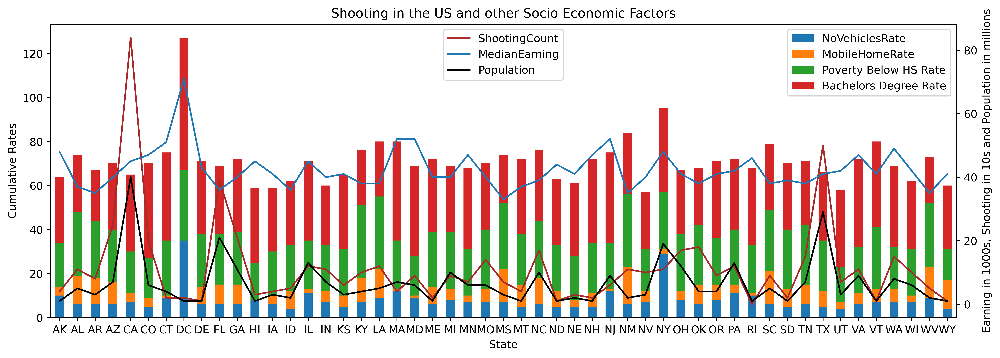

In [101]:
#new df with population
df_all_Stacked_withpop=df_all_withpop[['NoVehiclesRate','MobileHomeRate','Poverty Below HS Rate','Bachelors Degree Rate']]
df_all_Pop=round(df_all_withpop[['Population']]/1000000)

f1=df_all_Stacked_withpop.plot(kind='bar', stacked=True, figsize=(15, 5))
f2=df_all_Shoot['ShootingCount'].plot(secondary_y=True, color ='brown')
f3=df_MedianEarning['MedianEarning'].plot(secondary_y=True)
f4=df_all_Pop['Population'].plot(secondary_y=True, color ='black')

f1.set_ylabel('Cumulative Rates')
f2.set_ylabel('Earning in 1000s, Shooting in 10s and Population in millions')
f2.legend(loc='upper center')

plt.rcParams["figure.dpi"] = (800)

plt.title('Shooting in the US and other Socio Economic Factors')


In [103]:
#population by race
L = [20,41,50,4,28,235]
s = pd.Series(L, index=pvt_fill.columns)

#new df with shooting count per million
df1 = round(pvt_fill.div(s),1)
df1[s.index[s == 0]] = 1

df1


race,A,B,H,N,O,W
Year,,,,,,
2015,0.8,6.3,3.5,2.2,0.5,2.1
2016,0.8,5.8,3.2,4.2,0.4,2.0
2017,0.8,5.4,3.6,5.5,0.2,2.0
2018,1.1,5.7,3.4,4.0,0.1,2.0
2019,1.0,6.1,3.4,3.2,0.3,1.8
2020,0.8,6.0,3.4,2.2,0.1,2.0
2021,0.2,2.6,1.2,1.2,0.0,0.8


<Figure size 16000x24000 with 0 Axes>

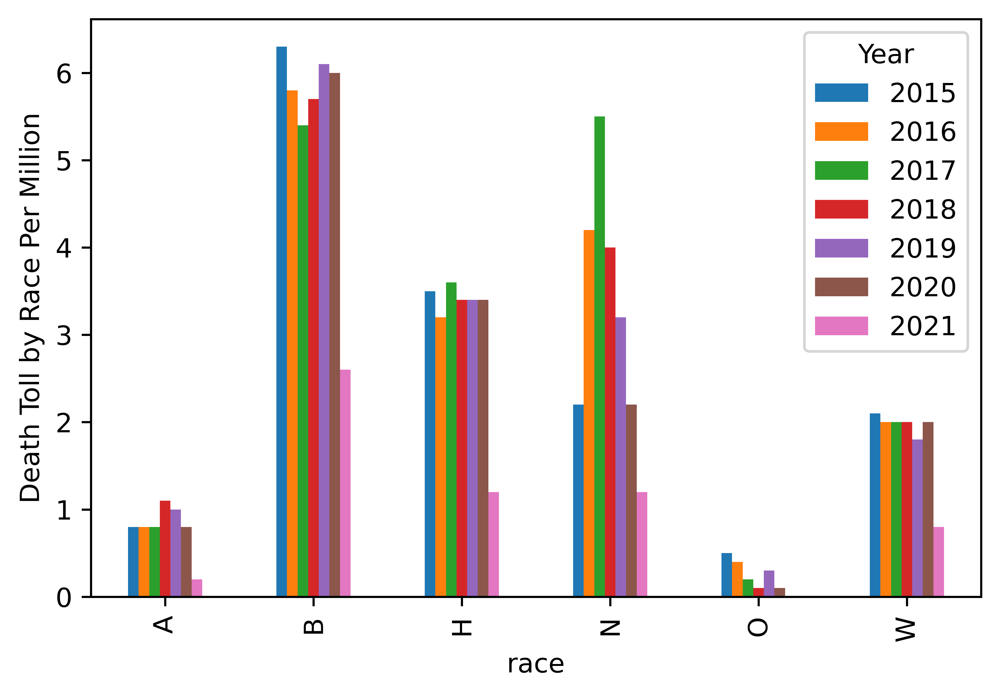

In [104]:
# stacked bar chart plot by year and race for per million
plt.figure(figsize=[20,30])
ax3=df1.T.plot(kind='bar')
ylab3=ax3.set_ylabel('Death Toll by Race Per Million')


Text(0.5, 1.0, 'Body Cam Use by Police')

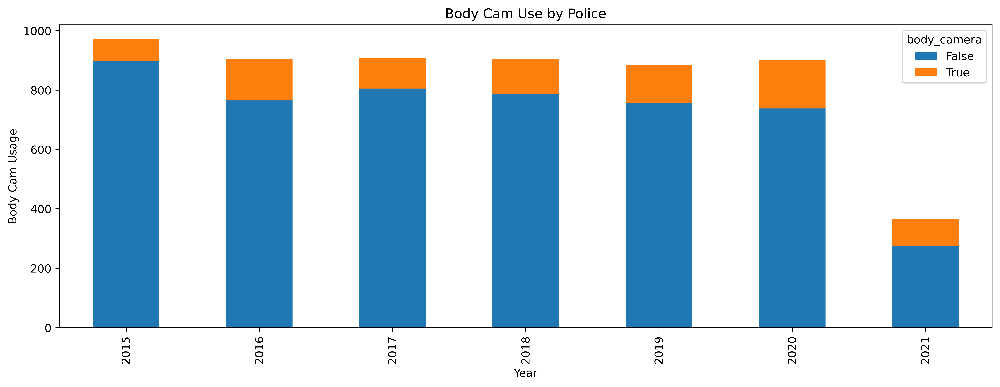

In [105]:
# use of body camera
pvt_cam=pd.pivot_table(df,index='Year',columns='body_camera',values='RaceCount', aggfunc='sum',fill_value=0)
fc=pvt_cam.plot(kind='bar', stacked=True, figsize=(15, 5))
fc.set_ylabel('Body Cam Usage')
plt.title('Body Cam Use by Police')
